# Imports

In [192]:
import os
import cv2
import numpy as np
from scipy.io import loadmat
from skimage.io import imread
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [193]:
# Set the style for Seaborn plots
sns.set_theme(style="white", rc={"axes.labelsize": 22, "xtick.labelsize": 18, "ytick.labelsize": 18})
sns.set_context("talk", font_scale=1.5)

# Define Paths

In [194]:
MAT_FILES_PATH = r'D:\David\endoderm_migration\raw_data\2024_05_20_FOXA2_tdtomato21_D2005\PIV\mat_files_pixel_per_frame_units'
SEGMENTATION_PATH = r'D:\David\endoderm_migration\raw_data\2024_05_20_FOXA2_tdtomato21_D2005\segmentations'
microns_per_pixel = 0.26

# Read Data

In [195]:
# read mat files
mat_files = [f for f in os.listdir(MAT_FILES_PATH) if f.endswith('.mat')]

In [196]:
# # Get segmentation folders
# segmentation_folders = [
#     f for f in os.listdir(SEGMENTATION_PATH) if os.path.isdir(os.path.join(SEGMENTATION_PATH, f))
# ]

# # Initialize dictionary to store segmentation images
# segmentation_images = {}

# # Traverse each folder and read segmentation images
# for folder in segmentation_folders:
#     folder_path = os.path.join(SEGMENTATION_PATH, folder)
#     timepoint_files = [
#         f for f in os.listdir(folder_path) if f.endswith(".png") and os.path.isfile(os.path.join(folder_path, f))
#     ]
#     # Read each .png file as an image
#     segmentation_images[folder] = {
#         os.path.splitext(file)[0]: imread(os.path.join(folder_path, file))
#         for file in timepoint_files
#     }

# # Example access:
# # plt.imshow(segmentation_images["sequence_a_segmented"]["01_segmented"])

# Define Functions

In [197]:
def calculate_weighted_averages(seg_folder, mat_file):
    """
    Calculate weighted averages for segmentation and u/v matrices.

    Args:
        seg_folder (str): Path to the folder containing segmentation images.
        mat_file (str): Path to the .mat file containing u_original and v_original.

    Returns:
        tuple: Weighted average arrays (u_weighted_avg, v_weighted_avg).
    """
    # Load .mat file
    mat = loadmat(mat_file)
    
    # Initialize lists to store intermediate results
    seg_list = []
    u_seg_products = []
    v_seg_products = []

    # Iterate through all segmentation images (assuming 72 frames)
    for i in range(72):
        # Read segmentation frame
        frame_path = os.path.join(seg_folder, f'{i:02d}_segmented.png')
        if not os.path.exists(frame_path):  # Handle missing frames
            continue
        frame = imread(frame_path) / 255  # Normalize to 0-1
        seg_list.append(frame)

        # Load u and v matrices
        u = mat['u_original'][i][0]
        v = mat['v_original'][i][0]

        # Convert units from pixel/frame to micron/hour (assuming 1 pixel = 0.26 microns and 1 frame = 20 minutes)
        u = u * 0.26 * 3  # 0.26 microns/pixel * 3 frames/hour
        v = v * 0.26 * 3  # 0.26 microns/pixel * 3 frames/hour

        # Resize u and v matrices to match the frame size
        u = cv2.resize(u, (frame.shape[1], frame.shape[0]), interpolation=cv2.INTER_LINEAR)
        v = cv2.resize(v, (frame.shape[1], frame.shape[0]), interpolation=cv2.INTER_LINEAR)

        # Replace NaN values with 0
        u = np.nan_to_num(u)
        v = np.nan_to_num(v)

        # Calculate products of segmentation and u/v
        u_seg_products.append(frame * u)
        v_seg_products.append(frame * v)

        # Withount multiplying by segmentation
        # u_seg_products.append(u)
        # v_seg_products.append(v)

    # Calculate sums for weighted average
    sum_frames = np.sum(np.array(seg_list), axis=0)
    sum_frame_u = np.sum(np.array(u_seg_products), axis=0)
    sum_frame_v = np.sum(np.array(v_seg_products), axis=0)
    sum_frame_u_sqr = np.sum(np.array(u_seg_products) ** 2, axis=0)
    sum_frame_v_sqr = np.sum(np.array(v_seg_products) ** 2, axis=0)

    # Avoid division by zero
    sum_frames = np.where(sum_frames == 0, 1, sum_frames)

    # Calculate weighted averages
    u_weighted_avg = sum_frame_u / sum_frames
    v_weighted_avg = sum_frame_v / sum_frames
    u_sqr_weighted_avg = sum_frame_u_sqr / sum_frames
    v_sqr_weighted_avg = sum_frame_v_sqr / sum_frames

    # Replace 0 with NaN in weighted averages
    u_weighted_avg = np.where(u_weighted_avg == 0, np.nan, u_weighted_avg)
    v_weighted_avg = np.where(v_weighted_avg == 0, np.nan, v_weighted_avg)
    u_sqr_weighted_avg = np.where(u_sqr_weighted_avg == 0, np.nan, u_sqr_weighted_avg)
    v_sqr_weighted_avg = np.where(v_sqr_weighted_avg == 0, np.nan, v_sqr_weighted_avg)

    return u_weighted_avg, v_weighted_avg, u_sqr_weighted_avg, v_sqr_weighted_avg

# Process Data

In [198]:
# Root directories for segmentation and .mat files
segmentation_root = SEGMENTATION_PATH
mat_root = MAT_FILES_PATH

# Collect all .mat files and segmentation folders
mat_files = sorted([f for f in os.listdir(mat_root) if f.endswith('.mat')])
segmentation_folders = sorted([
    f for f in os.listdir(segmentation_root) if os.path.isdir(os.path.join(segmentation_root, f))
])

# Ensure the lengths match
if len(mat_files) != len(segmentation_folders):
    raise ValueError("The number of .mat files and segmentation folders do not match.")

# Map mat files to segmentation folders based on alphabetical order
results = {}
for mat_file, seg_folder in zip(mat_files, segmentation_folders):
    mat_file_path = os.path.join(mat_root, mat_file)
    seg_folder_path = os.path.join(segmentation_root, seg_folder)

    # Process if both folder and file exist
    u_avg, v_avg, u_sqr_avg, v_sqr_avg = calculate_weighted_averages(seg_folder_path, mat_file_path)
    results[mat_file] = {
        "segmentation_folder": seg_folder,
        "u_weighted_avg": u_avg,
        "v_weighted_avg": v_avg,
        "u_sqr_weighted_avg": u_sqr_avg,
        "v_sqr_weighted_avg": v_sqr_avg
    }

In [199]:
mat_file = mat_files[0]
mat = loadmat(os.path.join(MAT_FILES_PATH, mat_file))
mat['u_original'][1][0]

array([[ 1.3485062e-01,  1.8816911e-01,  1.6055413e-01, ...,
        -1.0684443e-01, -4.0434681e-02,  4.2605877e-02],
       [-1.8383190e-02, -5.3437330e-02,  2.5951308e-01, ...,
        -2.6694844e-02,  3.8021840e-03,  1.7514622e-01],
       [-5.9296578e-02, -5.3286612e-02,  3.8662668e-02, ...,
        -1.5420679e-02,  1.2051919e-01,  2.5263134e-01],
       ...,
       [ 5.9085655e-01,  4.3147593e+00,  2.3898548e-01, ...,
        -7.6366961e-03, -1.1418456e-01, -4.1179985e-01],
       [ 2.6749344e+00,  1.4188221e+00,  2.8404114e+00, ...,
        -1.6719268e-01, -9.1971964e-02, -1.5689591e-01],
       [-1.9945929e+00,  9.5221024e+00,  5.0038142e+00, ...,
         1.9352156e-01,  2.4505705e-01,  1.5439260e-01]],
      shape=(139, 84), dtype=float32)

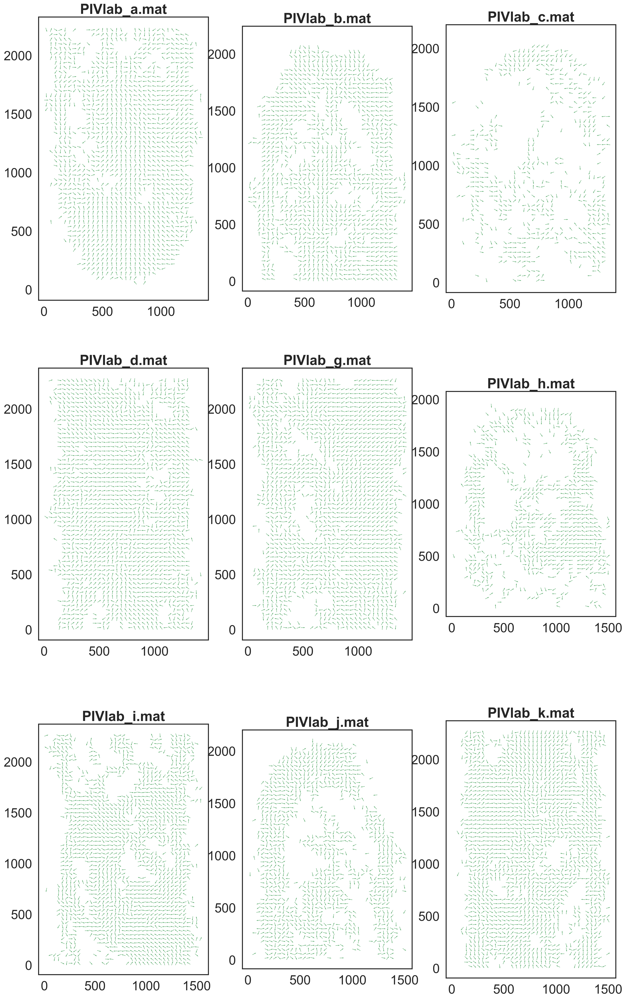

In [200]:
# plot a quiver plot for each mat file all in one figure
fig, axes = plt.subplots(3, 3, figsize=(20, 35))
fig.subplots_adjust(hspace=0.1, wspace=0.2)
axes = axes.flatten()

def bin_velocity_field(u, v, bin_size):
    H, W = u.shape
    H_binned = H // bin_size
    W_binned = W // bin_size
    
    u_binned = u[:H_binned*bin_size, :W_binned*bin_size].reshape(H_binned, bin_size, W_binned, bin_size).mean(axis=(1, 3))
    v_binned = v[:H_binned*bin_size, :W_binned*bin_size].reshape(H_binned, bin_size, W_binned, bin_size).mean(axis=(1, 3))
    
    X, Y = np.meshgrid(np.arange(W_binned)*bin_size + bin_size//2,
                       np.arange(H_binned)*bin_size + bin_size//2)
    
    return X, Y, u_binned, v_binned

bin_size = 40  # Instead of skip

for i, (mat_file, data) in enumerate(results.items()):
    u_avg = data["u_weighted_avg"]
    v_avg = data["v_weighted_avg"]
    seg_folder = data["segmentation_folder"]

    X, Y, u_binned, v_binned = bin_velocity_field(u_avg, v_avg, bin_size)

    # Create a quiver plot
    ax = axes[i]
    color = 'g'

    # Normalize vectors to unit length
    magnitude = np.sqrt(u_binned**2 + v_binned**2)
    u_norm = np.divide(u_binned, magnitude, out=np.zeros_like(u_binned), where=magnitude!=0)
    v_norm = np.divide(v_binned, magnitude, out=np.zeros_like(v_binned), where=magnitude!=0)

    quiver = ax.quiver(
        X, Y, u_norm, v_norm,
        scale=40,              # Tune this too
        scale_units='width',
        width=0.002,
        color='g',
        pivot='mid'
    )

    ax.set_title(f'{mat_file}')
    ax.set_aspect('equal')

In [201]:
X[0]

array([  20,   60,  100,  140,  180,  220,  260,  300,  340,  380,  420,
        460,  500,  540,  580,  620,  660,  700,  740,  780,  820,  860,
        900,  940,  980, 1020, 1060, 1100, 1140, 1180, 1220, 1260, 1300,
       1340, 1380, 1420, 1460, 1500])

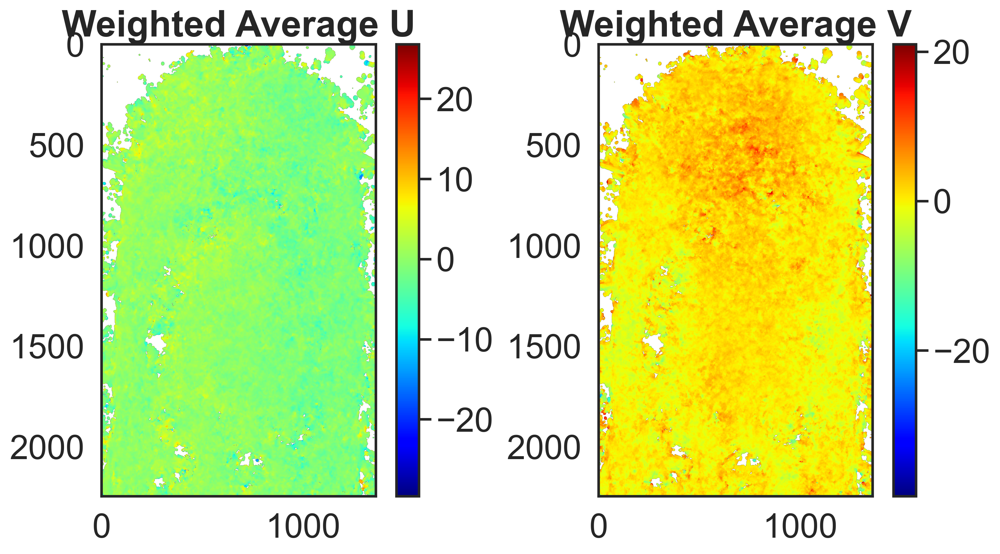

In [202]:
# Select a specific .mat file
selected_mat_file = mat_files[0]
selected_data = results[selected_mat_file]
u_avg = selected_data["u_weighted_avg"]
v_avg = selected_data["v_weighted_avg"]

# Plot u and v weighted averages
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(u_avg, cmap='jet')
axes[0].set_title("Weighted Average U")
axes[1].imshow(v_avg, cmap='jet')
axes[1].set_title("Weighted Average V")
# add colorbar
fig.colorbar(axes[0].imshow(u_avg, cmap='jet'), ax=axes[0])
fig.colorbar(axes[1].imshow(v_avg, cmap='jet'), ax=axes[1])
plt.show()

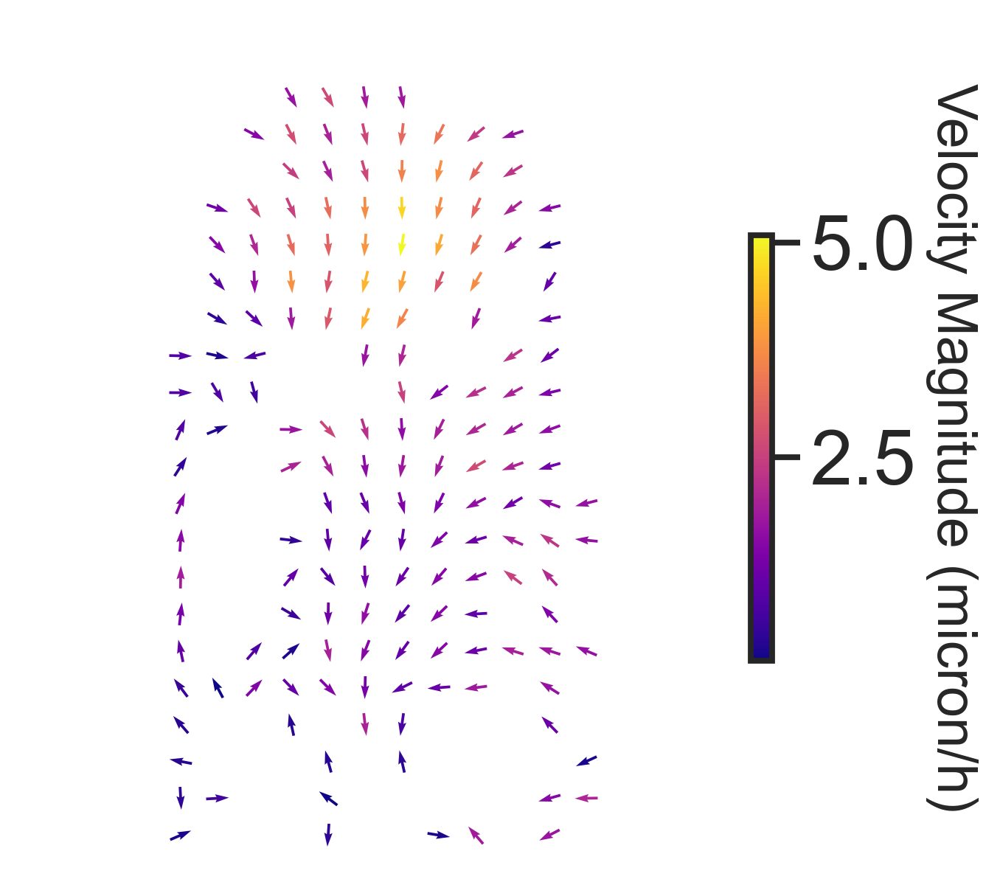

In [203]:
def bin_velocity_field(u, v, bin_size):
    H, W = u.shape
    H_binned = H // bin_size
    W_binned = W // bin_size
    
    u_binned = u[:H_binned*bin_size, :W_binned*bin_size].reshape(H_binned, bin_size, W_binned, bin_size).mean(axis=(1, 3))
    v_binned = v[:H_binned*bin_size, :W_binned*bin_size].reshape(H_binned, bin_size, W_binned, bin_size).mean(axis=(1, 3))
    
    X, Y = np.meshgrid(np.arange(W_binned)*bin_size + bin_size//2,
                       np.arange(H_binned)*bin_size + bin_size//2)
    
    return X, Y, u_binned, v_binned

bin_size = 100  # Instead of skip

X, Y, u_binned, v_binned = bin_velocity_field(u_avg, v_avg, bin_size)

fig, ax = plt.subplots()
fig.set_size_inches(5, 5)

# Normalize vectors to unit length
magnitude = np.sqrt(u_binned**2 + v_binned**2)
u_norm = np.divide(u_binned, magnitude, out=np.zeros_like(u_binned), where=magnitude!=0)
v_norm = np.divide(v_binned, magnitude, out=np.zeros_like(v_binned), where=magnitude!=0)
v_norm_flipped = -v_norm

quiver = ax.quiver(
        X, Y, u_norm, v_norm_flipped,
        magnitude,                # color by magnitude
        cmap='plasma',            # or 'viridis', 'inferno', etc.
        scale=30,                 # Tone this to control arrow size
        scale_units='width',
        width=0.004,
        color='k',
        pivot='mid'
    )

ax.invert_yaxis() 
# Add colorbar
cbar = fig.colorbar(quiver, ax=ax, shrink=0.5)
cbar.set_label('Velocity Magnitude (micron/h)', rotation=270, labelpad=20, fontsize=18)

# Clean axes
ax.axis('equal')
ax.axis('off')
plt.show()

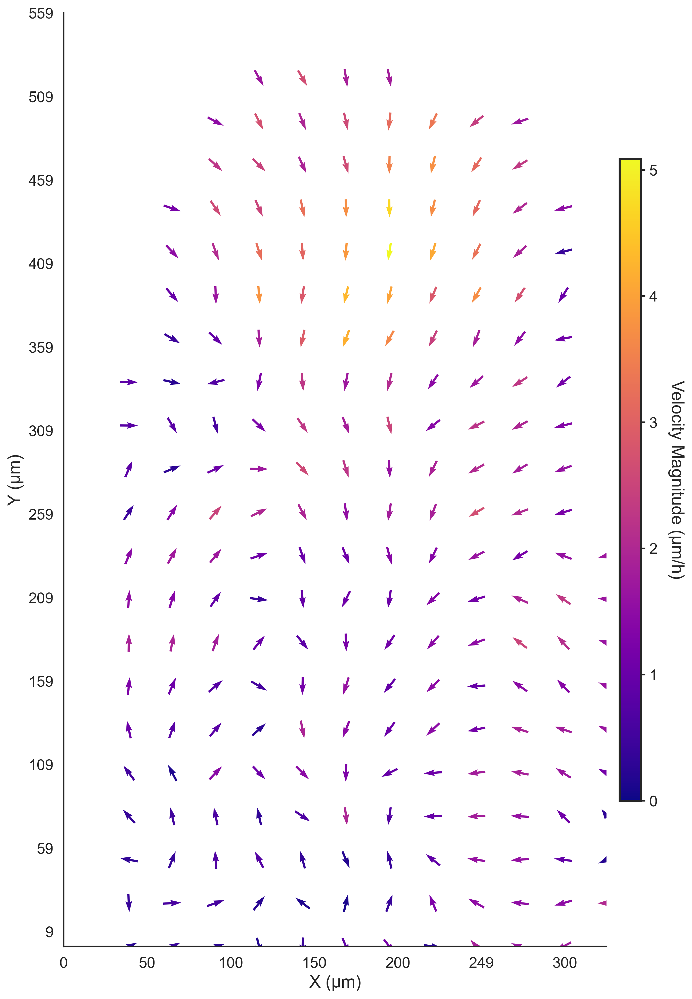

In [204]:
from scipy.interpolate import griddata

# Prepare grid and mask for valid (non-NaN) points
mask = ~np.isnan(u_binned) & ~np.isnan(v_binned)
points = np.column_stack((X[mask].ravel(), Y[mask].ravel()))
u_values = u_binned[mask].ravel()
v_values = v_binned[mask].ravel()

# Interpolate over the full grid
grid_points = np.column_stack((X.ravel(), Y.ravel()))
u_interp = griddata(points, u_values, grid_points, method='cubic').reshape(X.shape)
v_interp = griddata(points, v_values, grid_points, method='cubic').reshape(X.shape)

# Use interpolated values for normalization and plotting
magnitude = np.sqrt(u_interp**2 + v_interp**2)
u_norm = np.divide(u_interp, magnitude, out=np.zeros_like(u_interp), where=magnitude!=0)
v_norm = np.divide(v_interp, magnitude, out=np.zeros_like(v_interp), where=magnitude!=0)
v_norm_flipped = -v_norm

fig, ax = plt.subplots()
fig.set_size_inches(10, 15)

quiver = ax.quiver(
    X, Y, u_norm, v_norm_flipped,
    magnitude,
    cmap='plasma',
    scale=30,
    scale_units='width',
    width=0.004,
    color='k',
    pivot='mid'
)

quiver.set_clim(vmin=0)

# Invert image (flip it)
ax.invert_yaxis()

# Get data limits and convert to microns
x_max_pixels = X.max()
y_max_pixels = Y.max()
x_max_microns = x_max_pixels * microns_per_pixel
y_max_microns = y_max_pixels * microns_per_pixel

# Set axis limits to start from (0,0)
ax.set_xlim(0, x_max_pixels)
ax.set_ylim(0, y_max_pixels)

# Create ticks every 50 microns
tick_spacing_microns = 50
tick_spacing_pixels = tick_spacing_microns / microns_per_pixel # Convert to pixels

# Generate tick positions in pixels
x_tick_positions = np.arange(0, x_max_pixels, tick_spacing_pixels)
y_tick_positions = np.arange(0, y_max_pixels, tick_spacing_pixels)

# Generate tick labels in microns
x_tick_labels = [f'{int(pos * microns_per_pixel)}' for pos in x_tick_positions]
# For inverted y-axis, calculate labels so 0 appears at bottom
y_tick_labels = [f'{int((y_max_pixels - pos) * microns_per_pixel)}' for pos in y_tick_positions]

# Set custom ticks
ax.set_xticks(x_tick_positions)
ax.set_xticklabels(x_tick_labels)
ax.set_yticks(y_tick_positions)
ax.set_yticklabels(y_tick_labels)

# Set axis labels and styling
ax.set_xlabel('X (μm)', fontsize=16)
ax.set_ylabel('Y (μm)', fontsize=16)
ax.set_aspect('equal')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)
ax.tick_params(labelsize=14, width=1.5, length=6)

# Remove margins to ensure (0,0) start
plt.margins(0)
ax.invert_yaxis()

# Professional colorbar
cbar = fig.colorbar(quiver, ax=ax, shrink=0.6, aspect=30, pad=0.02)
cbar.set_label('Velocity Magnitude (μm/h)', rotation=270, labelpad=25, fontsize=16)
cbar.ax.tick_params(labelsize=14, width=1.5, length=4)

plt.tight_layout()
plt.show()

In [205]:
np.nanmean(u_avg[0])*3600

np.float64(-5568.416113078759)

### plot quiver plots for every pattern (and check why they appear flipped)

In [206]:
where_to_crop = {}
where_to_crop["a"] = "bottom"
where_to_crop["b"] = "top"
where_to_crop["c"] = "top"
where_to_crop["d"] = "middle"
where_to_crop["g"] = "middle"
where_to_crop["h"] = "top"
where_to_crop["i"] = "middle"
where_to_crop["j"] = "top"
where_to_crop["k"] = "middle"

In [207]:
# Find the shortest width among all frames
min_width = min(data["u_weighted_avg"].shape[1] for data in results.values())

# Create lists to store cropped arrays
u_avg_cropped_list = []
v_avg_cropped_list = []
u_sqr_avg_cropped_list = []
v_sqr_avg_cropped_list = []
velocity_magnitude_cropped_list = []

# Crop all u_weighted_avg arrays to a square (min_width x min_width) based on `where_to_crop`
u_cropped = []
for mat_file, data in results.items():
    u_avg = data["u_weighted_avg"]
    v_avg = data["v_weighted_avg"]
    u_sqr_avg = data["u_sqr_weighted_avg"]
    v_sqr_avg = data["v_sqr_weighted_avg"]
    velocity_magnitude = np.sqrt(u_sqr_avg + v_sqr_avg)

    current_height = u_avg.shape[0]
    current_width = u_avg.shape[1]
    
    # Crop horizontally (width)
    start_col = (current_width - min_width) // 2
    end_col = start_col + min_width
    
    # Determine vertical (height) cropping
    position_key = mat_file.split("_")[1][0]  # Extract position key (e.g., "a" from "PIVlab_a.mat")
    crop_strategy = where_to_crop.get(position_key, "middle")  # Default to "middle" if not found
    
    if crop_strategy == "top":
        start_row = 0
        end_row = min_width
    elif crop_strategy == "bottom":
        start_row = current_height - min_width
        end_row = current_height
    elif crop_strategy == "middle":
        start_row = (current_height - min_width) // 2
        end_row = start_row + min_width
    else:
        raise ValueError(f"Unknown crop strategy: {crop_strategy}")
    
    # Perform cropping
    u_avg_cropped = u_avg[start_row:end_row, start_col:end_col]
    v_avg_cropped = v_avg[start_row:end_row, start_col:end_col]
    u_sqr_avg_cropped = u_sqr_avg[start_row:end_row, start_col:end_col]
    v_sqr_avg_cropped = v_sqr_avg[start_row:end_row, start_col:end_col]
    velocity_magnitude_cropped = velocity_magnitude[start_row:end_row, start_col:end_col]

    # Append the cropped arrays to the list
    u_avg_cropped_list.append(u_avg_cropped)
    v_avg_cropped_list.append(v_avg_cropped)
    u_sqr_avg_cropped_list.append(u_sqr_avg_cropped)
    v_sqr_avg_cropped_list.append(v_sqr_avg_cropped)
    velocity_magnitude_cropped_list.append(velocity_magnitude_cropped)

# Stack the cropped arrays and calculate the average velocities
u_avg_cropped_stacked = np.stack(u_avg_cropped_list, axis=0)
v_avg_cropped_stacked = np.stack(v_avg_cropped_list, axis=0)
u_sqr_avg_cropped_stacked = np.stack(u_sqr_avg_cropped_list, axis=0)
v_sqr_avg_cropped_stacked = np.stack(v_sqr_avg_cropped_list, axis=0)
velocity_magnitude_cropped_stacked = np.stack(velocity_magnitude_cropped_list, axis=0)


In [208]:
# u_avg_cropped_stacked is an array containing the cropped u weighted averages across time for each of the nine positions
# i want to calculate the mean and std Vx and Vy across all nine positions
# # so i first need to calculate the mean Vx across the y axis for each position, then take the mean and std across all positions
mean_Vx_across_x = np.nanmean(u_avg_cropped_stacked, axis=1)  # Mean across y axis for each position
mean_sqr_Vx_across_x = np.nanmean(u_sqr_avg_cropped_stacked, axis=1)  # Mean across y axis for each position
mean_mean_Vx = np.nanmean(mean_Vx_across_x, axis=0)  # Mean across all positions
mean_mean_sqr_Vx = np.nanmean(mean_sqr_Vx_across_x, axis=0)  # Mean across all positions
std_mean_Vx = np.nanstd(mean_Vx_across_x, axis=0)
std_mean_sqr_Vx = np.nanstd(mean_sqr_Vx_across_x, axis=0)

mean_Vy_across_y = np.nanmean(v_avg_cropped_stacked, axis=1)  # Mean across y axis for each position
mean_sqr_Vy_across_y = np.nanmean(v_sqr_avg_cropped_stacked, axis=1)  # Mean across y axis for each position

mean_mean_Vy = np.nanmean(mean_Vy_across_y, axis=0)
mean_mean_sqr_Vy = np.nanmean(mean_sqr_Vy_across_y, axis=0)
std_mean_Vy = np.nanstd(mean_Vy_across_y, axis=0)
std_mean_sqr_Vy = np.nanstd(mean_sqr_Vy_across_y, axis=0)

In [209]:
# Create a DataFrame for plotting
df = pd.DataFrame({
    'x_micrometers': np.arange(len(mean_mean_Vx)) * microns_per_pixel, # Assuming each pixel represents 0.26 micrometers
    'u_avg': mean_mean_Vx,
    'u_std': std_mean_Vx,
    'v_avg': mean_mean_Vy,
    'v_std': std_mean_Vy,
    'u_sqr_avg': mean_mean_sqr_Vx,
    'u_sqr_std': std_mean_sqr_Vx,
    'v_sqr_avg': mean_mean_sqr_Vy,
    'v_sqr_std': std_mean_sqr_Vy,
    'velocity_magnitude': None
})

# THE ONE PLOT

In [233]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# =============================================================================
# UNIFIED THESIS STYLE CONFIGURATION
# =============================================================================

# Set global parameters for consistent thesis-quality figures
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "Helvetica"],
    "font.size": 10,
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "text.usetex": False,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "axes.titleweight": "bold",
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "lines.linewidth": 1.5,
    "axes.linewidth": 1.2,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.major.size": 4,
    "ytick.major.size": 4,
    "axes.grid": False,
    "grid.alpha": 0.3,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

# Consistent color scheme for thesis
COLORS = {
    'vx': '#1f77b4',  # Professional blue
    'vy': '#ff7f0e',  # Professional orange
    'colormap': 'viridis',  # Scientific colormap (better than jet/plasma for publications)
}

# =============================================================================
# PLOT 1: VECTOR FIELD (QUIVER PLOT)
# =============================================================================

def plot_vector_field(X, Y, u_binned, v_binned, microns_per_pixel):
    """Create quiver plot with unified thesis style
    
    Y axis starts at 0 (size) and y ticks are rounded to 100 μm increments.
    """
    # Prepare grid and mask for valid (non-NaN) points
    mask = ~np.isnan(u_binned) & ~np.isnan(v_binned)
    points = np.column_stack((X[mask].ravel(), Y[mask].ravel()))
    u_values = u_binned[mask].ravel()
    v_values = v_binned[mask].ravel()

    # Interpolate over the full grid
    grid_points = np.column_stack((X.ravel(), Y.ravel()))
    u_interp = griddata(points, u_values, grid_points, method='cubic').reshape(X.shape)
    v_interp = griddata(points, v_values, grid_points, method='cubic').reshape(X.shape)

    # Use interpolated values for normalization and plotting
    magnitude = np.sqrt(u_interp**2 + v_interp**2)
    u_norm = np.divide(u_interp, magnitude, out=np.zeros_like(u_interp), where=magnitude!=0)
    v_norm = np.divide(v_interp, magnitude, out=np.zeros_like(v_interp), where=magnitude!=0)
    v_norm_flipped = -v_norm

    fig, ax = plt.subplots(figsize=(4.5, 6.5), dpi=300)

    X_um = X * microns_per_pixel
    Y_um = Y * microns_per_pixel

    quiver = ax.quiver(
        X_um, Y_um, u_norm, v_norm_flipped,
        magnitude,
        cmap=COLORS['colormap'],
        scale=13,
        scale_units='width',
        width=0.009,
        pivot='mid'
    )

    quiver.set_clim(vmin=0)

    # Ensure Y axis starts at 0 (size) and ticks are rounded to 100 μm
    y_max = float(np.nanmax(Y_um))
    y_max_rounded = int(np.ceil(y_max / 100.0) * 100)
    ax.set_ylim(0, y_max_rounded)

    y_ticks = np.arange(0, y_max_rounded + 1, 100)
    ax.set_yticks(y_ticks[::-1])  # Exclude the last tick if it exceeds the data range
    ax.set_yticklabels([str(int(t)) for t in y_ticks])

    # Optionally set X limits and ticks consistently
    x_min = float(np.nanmin(X_um))
    x_max = float(np.nanmax(X_um))
    ax.set_xlim(x_min, x_max)

    # Axis labels and aspect
    ax.set_xlabel('X (μm)')
    ax.set_ylabel('Y (μm)')
    ax.set_aspect('equal')
    ax.invert_yaxis()

    # Professional colorbar
    cbar = fig.colorbar(quiver, ax=ax, shrink=0.7, aspect=25, pad=0.02)
    cbar.set_label('Velocity (μm/h)', rotation=270, labelpad=20)
    cbar.ax.tick_params(width=1.2, length=4)

    plt.tight_layout()
    return fig, ax

# =============================================================================
# PLOT 2: VELOCITY PROFILES
# =============================================================================

def plot_velocity_profiles(df):
    """Create velocity profile plots with unified thesis style"""
    
    fig, axes = plt.subplots(2, 1, figsize=(4.5, 5), sharex=True, dpi=300)

    # --- Upper panel: Average velocity components ---
    axes[0].plot(df['x_micrometers'], df['u_avg'], 
                label=r'$V_x$', color=COLORS['vx'], linewidth=1.5)
    axes[0].fill_between(df['x_micrometers'], 
                        df['u_avg'] - df['u_std'], 
                        df['u_avg'] + df['u_std'], 
                        color=COLORS['vx'], alpha=0.2, linewidth=0)
    
    axes[0].plot(df['x_micrometers'], df['v_avg'], 
                label=r'$V_y$', color=COLORS['vy'], linewidth=1.5)
    axes[0].fill_between(df['x_micrometers'], 
                        df['v_avg'] - df['v_std'], 
                        df['v_avg'] + df['v_std'], 
                        color=COLORS['vy'], alpha=0.2, linewidth=0)
    
    axes[0].axhline(0, color='black', linewidth=0.8, linestyle='--', alpha=0.5)
    axes[0].set_xlim(0, df['x_micrometers'].max())
    axes[0].set_ylabel(r'Velocity (μm/h)')
    axes[0].legend(loc='lower left', frameon=False)
    axes[0].set_title('(a) Velocity components', loc='left')

    # --- Lower panel: Squared velocity components ---
    axes[1].plot(df['x_micrometers'], df['u_sqr_avg'] / 1, 
                label=r'$V_x^2$', color=COLORS['vx'], linewidth=1.5)
    axes[1].fill_between(df['x_micrometers'], 
                        (df['u_sqr_avg'] - df['u_sqr_std']) / 1, 
                        (df['u_sqr_avg'] + df['u_sqr_std']) / 1, 
                        color=COLORS['vx'], alpha=0.2, linewidth=0)
    
    axes[1].plot(df['x_micrometers'], df['v_sqr_avg'] / 1, 
                label=r'$V_y^2$', color=COLORS['vy'], linewidth=1.5)
    axes[1].fill_between(df['x_micrometers'], 
                        (df['v_sqr_avg'] - df['v_sqr_std']) / 1,  
                        (df['v_sqr_avg'] + df['v_sqr_std']) / 1, 
                        color=COLORS['vy'], alpha=0.2, linewidth=0)
    
    axes[1].set_ylim(0, None)
    axes[1].set_xlabel('X (μm)')
    axes[1].set_ylabel(r'Velocity$^2$ (μm$^2$/h$^2$)')
    axes[1].legend(loc='lower left', frameon=False)
    axes[1].set_title('(b) Squared velocity components', loc='left')

    plt.tight_layout()
    return fig, axes

# =============================================================================
# PLOT 3: VELOCITY HEATMAPS
# =============================================================================

def plot_velocity_heatmaps(df, u_avg_cropped_mean, v_avg_cropped_mean, microns_per_pixel):
    """Create velocity heatmaps with unified thesis style (separate colorbars)."""
    
    fig, axes = plt.subplots(
        2, 1, figsize=(4.5, 6),
        sharex=True, constrained_layout=True, dpi=300
    )

    # --- Upper panel: Vx heatmap ---
    im_vx = axes[0].imshow(
        u_avg_cropped_mean,
        cmap=COLORS['colormap'],
        aspect='equal',
        extent=[
            df['x_micrometers'].min(), df['x_micrometers'].max(),
            0, u_avg_cropped_mean.shape[0] * microns_per_pixel
        ],
        origin='lower'
    )
    axes[0].set_title(r"(a) Mean $V_x$", loc='left')
    axes[0].set_ylabel("Y (μm)")

    # Colorbar for Vx
    cbar_vx = fig.colorbar(
        im_vx, ax=axes[0], orientation='vertical',
        shrink=0.85, pad=0.02
    )
    cbar_vx.set_label(r'$V_x$ (μm/h)', rotation=270, labelpad=20)
    cbar_vx.ax.tick_params(width=1.2, length=4)

    # --- Lower panel: Vy heatmap ---
    im_vy = axes[1].imshow(
        v_avg_cropped_mean,
        cmap=COLORS['colormap'],
        aspect='equal',
        extent=[
            df['x_micrometers'].min(), df['x_micrometers'].max(),
            0, v_avg_cropped_mean.shape[0] * microns_per_pixel
        ],
        origin='lower'
    )
    axes[1].set_title(r"(b) Mean $V_y$", loc='left')
    axes[1].set_ylabel("Y (μm)")
    axes[1].set_xlabel("X (μm)")

    # Colorbar for Vy
    cbar_vy = fig.colorbar(
        im_vy, ax=axes[1], orientation='vertical',
        shrink=0.85, pad=0.02
    )
    cbar_vy.set_label(r'$V_y$ (μm/h)', rotation=270, labelpad=20)
    cbar_vy.ax.tick_params(width=1.2, length=4)
    
    return fig, axes


# =============================================================================
# USAGE EXAMPLE
# =============================================================================

if __name__ == "__main__":
    # Uncomment and use with your actual data:
    
    # Figure 1: Vector field
    # fig1, ax1 = plot_vector_field(X, Y, u_binned, v_binned)
    # plt.savefig('fig1_vector_field.pdf', bbox_inches='tight')
    # plt.savefig('fig1_vector_field.png', bbox_inches='tight')
    # plt.show()
    
    # Figure 2: Velocity profiles
    # fig2, axes2 = plot_velocity_profiles(df)
    # plt.savefig('fig2_velocity_profiles.pdf', bbox_inches='tight')
    # plt.savefig('fig2_velocity_profiles.png', bbox_inches='tight')
    # plt.show()
    
    # Figure 3: Velocity heatmaps
    # fig3, axes3 = plot_velocity_heatmaps(df, u_avg_cropped_mean, v_avg_cropped_mean)
    # plt.savefig('fig3_velocity_heatmaps.pdf', bbox_inches='tight')
    # plt.savefig('fig3_velocity_heatmaps.png', bbox_inches='tight')
    # plt.show()
    
    print("Unified thesis plotting functions created successfully!")
    print("\nKey improvements:")
    print("✓ Consistent color scheme (professional blue/orange)")
    print("✓ Unified font sizes and styles")
    print("✓ Matching line widths and axis styling")
    print("✓ Scientific colormap (viridis instead of jet/plasma)")
    print("✓ Consistent subplot labeling (a, b, c)")
    print("✓ Standard figure sizes for thesis (adjustable)")
    print("✓ PDF export capability for vector graphics")

Unified thesis plotting functions created successfully!

Key improvements:
✓ Consistent color scheme (professional blue/orange)
✓ Unified font sizes and styles
✓ Matching line widths and axis styling
✓ Scientific colormap (viridis instead of jet/plasma)
✓ Consistent subplot labeling (a, b, c)
✓ Standard figure sizes for thesis (adjustable)
✓ PDF export capability for vector graphics


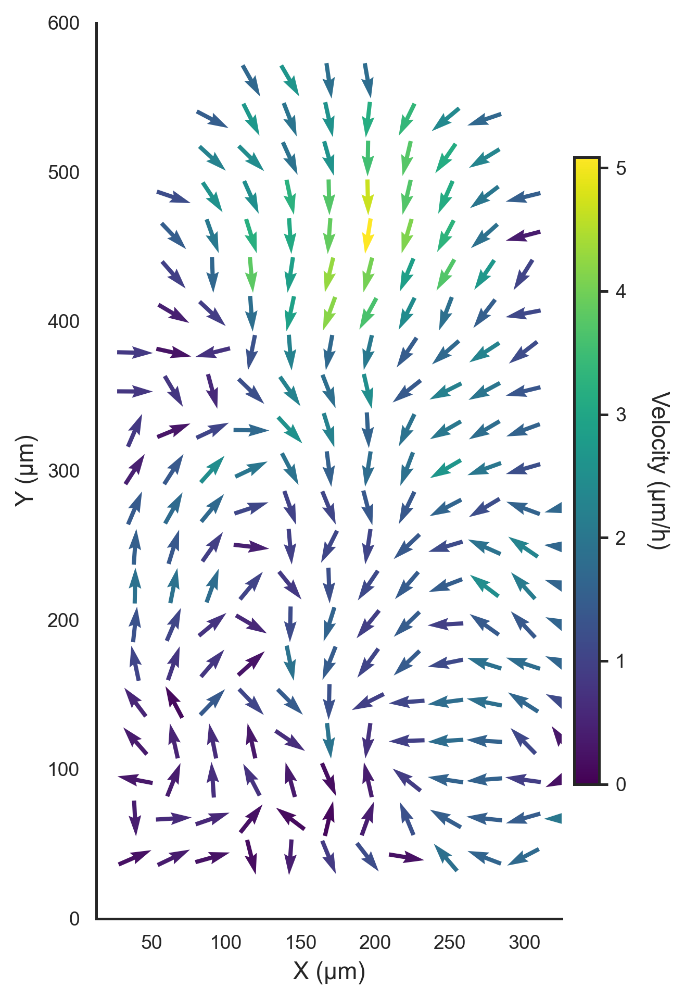

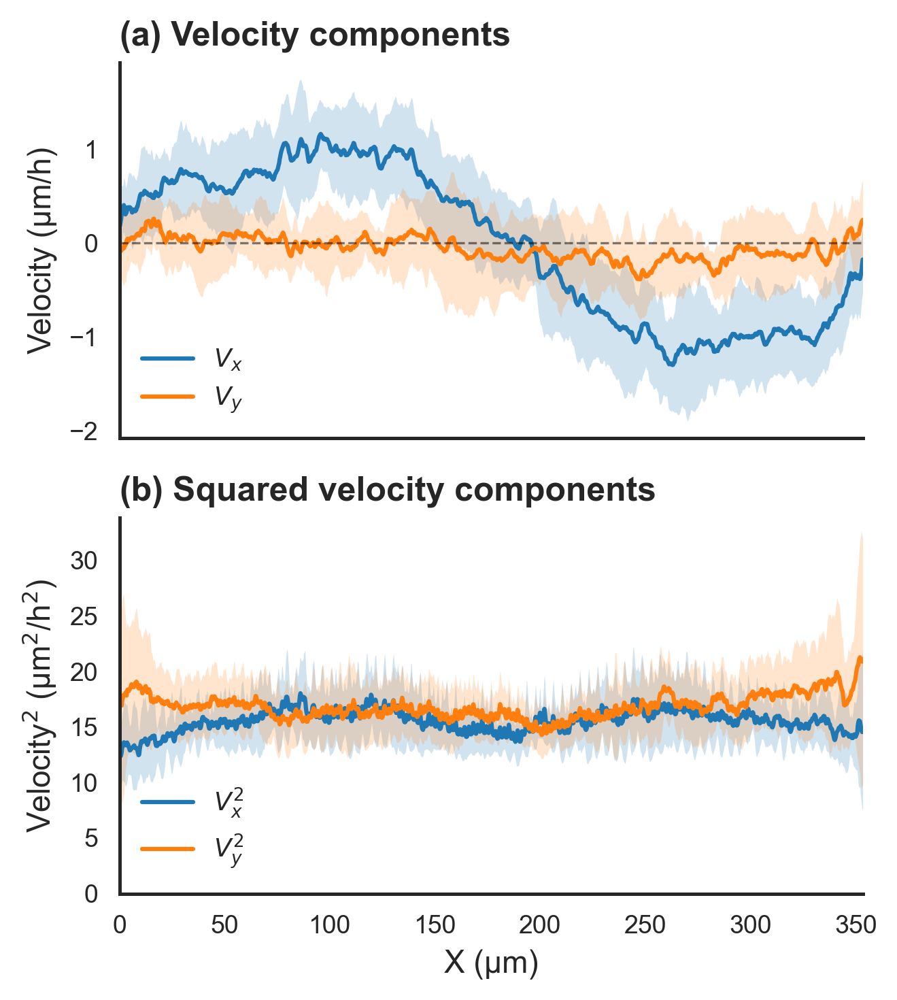

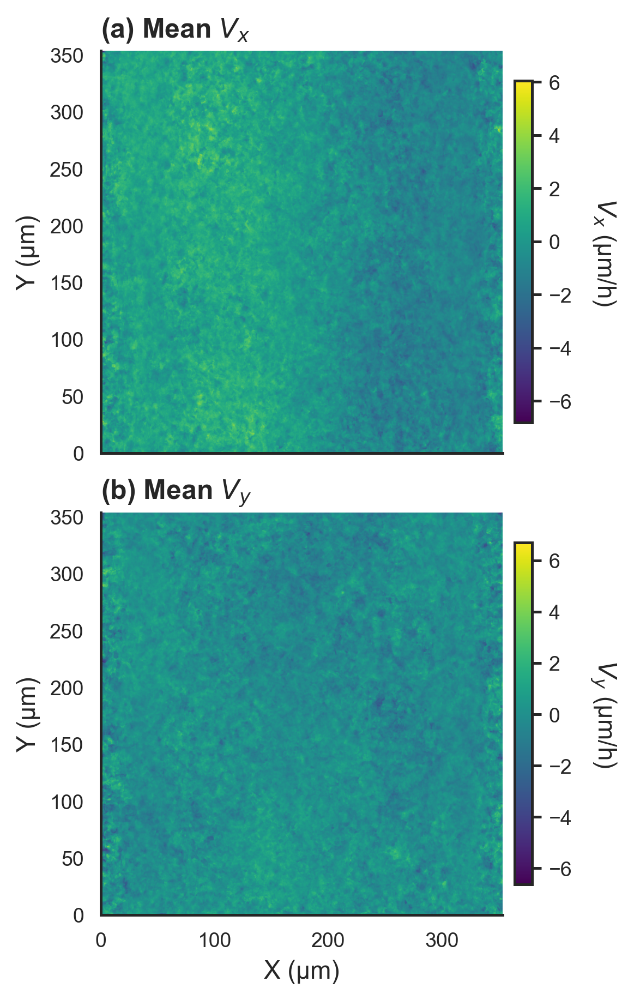

In [234]:
# Simply call the functions with your data:
fig1, ax1 = plot_vector_field(X, Y, u_binned, v_binned, microns_per_pixel=0.26)
fig2, axes2 = plot_velocity_profiles(df)
fig3, axes3 = plot_velocity_heatmaps(df, u_avg_cropped_mean, v_avg_cropped_mean, microns_per_pixel=0.26)

# Save as PDF for your thesis (vector graphics = perfect quality)
# plt.savefig('figure1.pdf', bbox_inches='tight')